In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import sys
import pathlib
from mpl_toolkits.axes_grid1 import ImageGrid
from tensorflow.keras.preprocessing import image
import matplotlib.cm as cm
# sets the path to the home directory of this repository so other modules can be imported. 
root_path = os.path.split(os.getcwd())[0]
assert root_path.endswith("mask-detection"), "The root path does not end with mask-detection: " + root_path 
sys.path.insert(0, root_path)
path = pathlib.Path(root_path + '/data/facemask-dataset')
mario_path = pathlib.Path(root_path + '/data/mario')

# set the seed for reproducible results.
np.random.seed(0)
tf.random.set_seed(0)

# GPU settings
physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

print(tf.__version__)

2.3.0


In [2]:
from datasets.facemask_dataset import FacemaskDataset
batch_size = 64
train_percentage = 0.6
validation_percentage = 0.2
test_percentage = 0.2
ds = FacemaskDataset(path, batch_size, 200, 200, True, train_percentage, validation_percentage, test_percentage)

train: 36 validation: 12 test: 12


In [3]:
X_test_1_batch, y_test_1_batch = next(ds.actual_test_ds.as_numpy_iterator())

In [4]:
X_test_1_batch.shape, y_test_1_batch.shape

((64, 200, 200, 3), (64,))

In [5]:
model = tf.keras.models.load_model(f'{root_path}/models/cnn1')

In [6]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
rescaling (Rescaling)        (None, 200, 200, 3)       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 198, 198, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 99, 99, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 97, 97, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 48, 48, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 48, 48, 32)        0

In [7]:
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

def make_gradcam_heatmap(
    img_array, model, last_conv_layer_name, classifier_layer_names
):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer
    last_conv_layer = model.get_layer(last_conv_layer_name)
    last_conv_layer_model = Model(model.inputs, last_conv_layer.output)

    # Second, we create a model that maps the activations of the last conv
    # layer to the final class predictions
    classifier_input = Input(shape=last_conv_layer.output.shape[1:])
    # print([lyr.name for lyr in last_conv_layer_model.layers])
    x = classifier_input
    for layer_name in classifier_layer_names:
        x = model.get_layer(layer_name)(x)
    classifier_model = Model(classifier_input, x)

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        # Compute activations of the last conv layer and make the tape watch it
        last_conv_layer_output = last_conv_layer_model(img_array)
        tape.watch(last_conv_layer_output)
        # Compute class predictions
        preds = classifier_model(last_conv_layer_output)
        top_pred_index = tf.argmax(preds[0])
        top_class_channel = preds[:, top_pred_index]

    # This is the gradient of the top predicted class with regard to
    # the output feature map of the last conv layer
    grads = tape.gradient(top_class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    last_conv_layer_output = last_conv_layer_output.numpy()[0]
    pooled_grads = pooled_grads.numpy()
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    # The channel-wise mean of the resulting feature map
    # is our heatmap of class activation
    heatmap = np.mean(last_conv_layer_output, axis=-1)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap

In [8]:
conv_layers = [layer for layer in model.layers if "conv" in layer.name]
layer = conv_layers[-1]
print(layer.name)

conv2d_2


In [9]:
# get the last layers which make it a classifier.
# since this is a model which has two outputs, we can just remove out_asym  
classifier_layer_names = [lyr.name for lyr in model.layers][-6:]

In [10]:
def get_heatmaps(X):
    heatmaps = np.zeros((X.shape[0], 46, 46))
    for i in range(X.shape[0]):
        heatmaps[i] = make_gradcam_heatmap(np.expand_dims(X[i], 0), model, layer.name, classifier_layer_names)
    return heatmaps

In [11]:
heatmaps = get_heatmaps(X_test_1_batch)

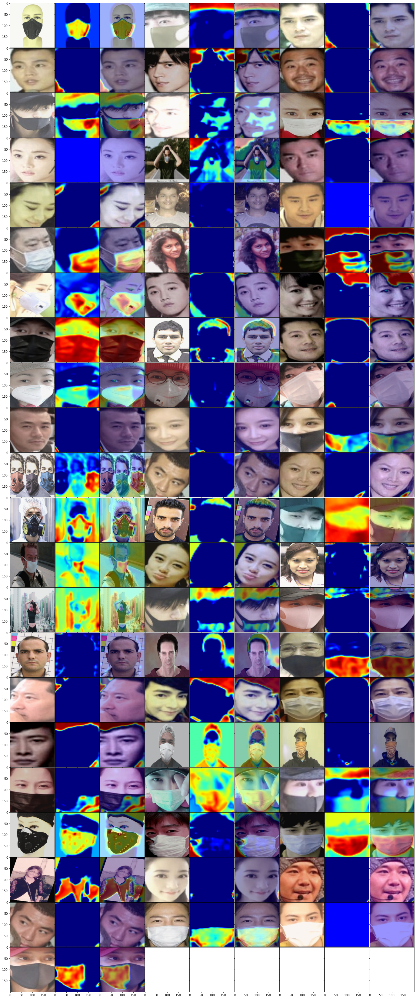

In [12]:
# !pip install pyqt5
# %matplotlib inline
fig = plt.figure(figsize=(30, 60))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=((batch_size // 3) + 1, 9),  # creates 2x2 grid of axes
                #  axes_pad=0.1,  # pad between axes in inch.
                 )
jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]

for i in range(batch_size):
    input_image = X_test_1_batch[i]
    heatmap = heatmaps[i]
    
    h = np.uint8(255 * heatmap)
    jet_heatmap = jet_colors[h]

    jet_heatmap = image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((input_image.shape[1], input_image.shape[0]))
    jet_heatmap = image.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * 0.5 + (input_image * 255)
    superimposed_img = image.array_to_img(superimposed_img)
    
    j = i * 3
    grid[j].imshow(input_image)
    grid[j + 1].imshow(image.array_to_img(jet_heatmap))
    grid[j + 2].imshow(superimposed_img)

plt.show()

In [13]:
import glob
from PIL import Image
import re

jet = cm.get_cmap("jet")
jet_colors = jet(np.arange(256))[:, :3]

def plot_marios(folder):
    marios = []
    masked = []
    for filename in glob.glob(f'{root_path}/data/{folder}/*.jpg'):
        if re.search(r'_masked_', filename):
            masked.append(True)
        else:
            masked.append(False)
        im = Image.open(filename)
        marios.append(im)
    y = np.array(masked)
    X = np.array([image.img_to_array(im.resize((200, 200), 0)) / 255 for im in marios])
    y_pred = model.predict(X)
    heatmaps = get_heatmaps(X)

    fig = plt.figure(figsize=(25, 50))
    grid = ImageGrid(fig, 111, nrows_ncols=((8 // 3) + 1, 9), axes_pad=0.3)

    for i in range(8):
        input_image = X[i]
        heatmap = heatmaps[i]
        
        h = np.uint8(255 * heatmap)
        jet_heatmap = jet_colors[h]
        jet_heatmap = image.array_to_img(jet_heatmap)
        jet_heatmap = jet_heatmap.resize((input_image.shape[1], input_image.shape[0]))
        jet_heatmap = image.img_to_array(jet_heatmap)

        superimposed_img = jet_heatmap * 0.5 + (input_image * 255)
        superimposed_img = image.array_to_img(superimposed_img)
        
        j = i * 3
        color = 'r'
        maskedd = "Without mask"
        if (y_pred[i] > 0.5) == y[i]:
            color = 'g'
        if y[i]:
            maskedd = "With mask"
        fontdict = { 'color': color }

        grid[j].set_title(maskedd, fontdict = fontdict)
        grid[j].imshow(input_image)
        grid[j + 1].imshow(image.array_to_img(jet_heatmap))
        grid[j + 2].imshow(superimposed_img)
    plt.axis("off")
    plt.show()

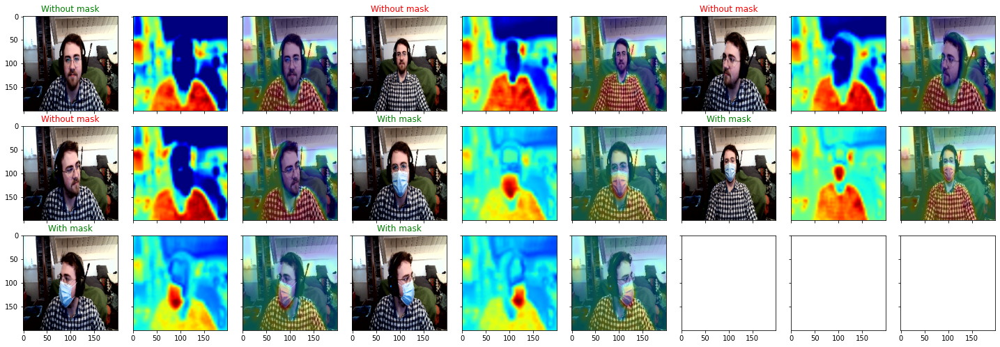

In [14]:
plot_marios('mario')

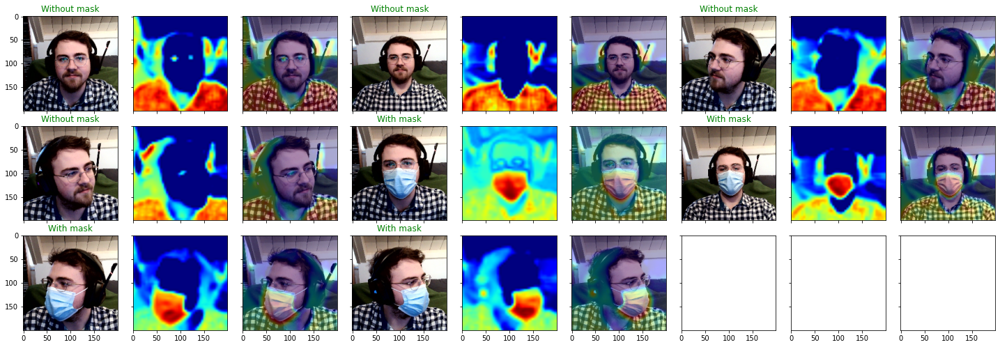

In [15]:
plot_marios('mario close')

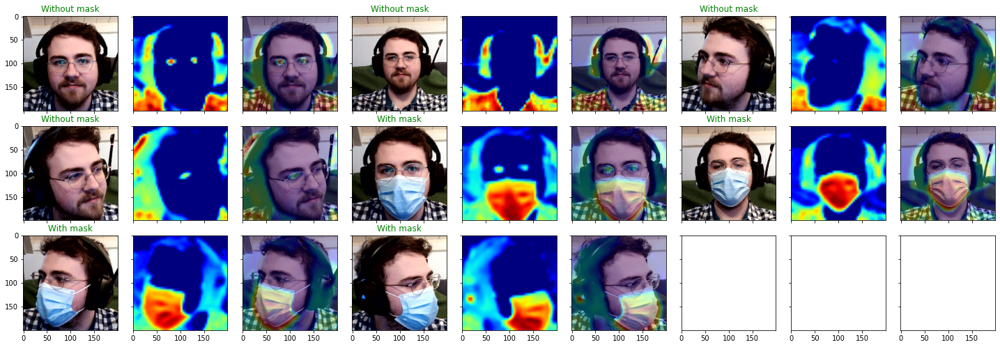

In [16]:
plot_marios('mario super close')